# Exploratory cerium plots with base MWM DR19 data

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, BoundaryNorm
from scipy import stats
from scipy.optimize import curve_fit

import paths
from utils import get_color_list, get_bin_centers, binned_quantiles
from mwm_sample import abundance_ratio

In [3]:
plt.style.use(paths.styles / 'notebook.mplstyle')

In [4]:
mwm_rgb = pd.read_csv(paths.data / 'MWM' / 'MWM_RGB.csv')
mwm_rgb

/var/folders/_s/lknhlnjn1g1cj388brpgztf80000gn/T/ipykernel_2751/610113364.py:1: DtypeWarning: Columns (44) have mixed types. Specify dtype option on import or set low_memory=False.
  mwm_rgb = pd.read_csv(paths.data / 'MWM' / 'MWM_RGB.csv')



,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,e,parallax,ra_y,dec_y,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,ruwe,z_max,Rg
0,54381291,NaN,421495278551818624,421495278551818624,403218924,16384,tic_v8,25,27021597850714872,4291430952,...,NaN,0.132960,4.281347,56.316985,14.488654,15.619171,13.432241,1.114031,NaN,NaN
1,54381397,NaN,421505552113500800,421505552113500800,369831391,16384,tic_v8,25,27021597850723334,4291439436,...,NaN,0.229285,4.066874,56.422930,13.574258,14.658734,12.552815,1.032361,NaN,NaN
2,54381959,2M00224114+5636475,421557607115380608,421557607115380608,403393455,16025,gaia_dr3_source,31,63050394783222145,4291878516,...,0.176938,0.534588,5.671459,56.613157,11.369628,12.251155,10.450673,1.183852,0.205899,8.531358
3,54381962,NaN,421557744554456064,421557744554456064,403393481,16025,tic_v8,25,27021597851161095,4291878605,...,0.023527,0.821440,5.742822,56.604244,11.354103,12.103177,10.509450,1.051452,0.107297,8.766076
4,54381968,2M00220667+5639444,421558740986710784,421558740986710784,403316795,16025,gaia_dr3_source,31,63050394783222492,4291878364,...,NaN,0.236960,5.527785,56.662334,14.917342,15.824887,13.976727,1.005231,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181614,129060878,2M11484212-6220219,5334808943135705600,5334808943135705600,324668848,185355,gaia_dr3_source,31,63050395882762275,5762936654,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181615,129060885,2M08333243-3911278,5529360241405866752,5529360241405866752,185021879,160694,gaia_dr3_source,31,63050395950945615,5800869040,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181616,129060909,2M13582184-6202236,5866253799616922112,5866253799616922112,325588166,185382,gaia_dr3_source,31,63050396108514375,5632820971,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181617,129060928,2M18243818-1635046,4096998479419908352,4096998479419908352,333258955,126601,gaia_dr3_source,31,63050395404576784,5037812306,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


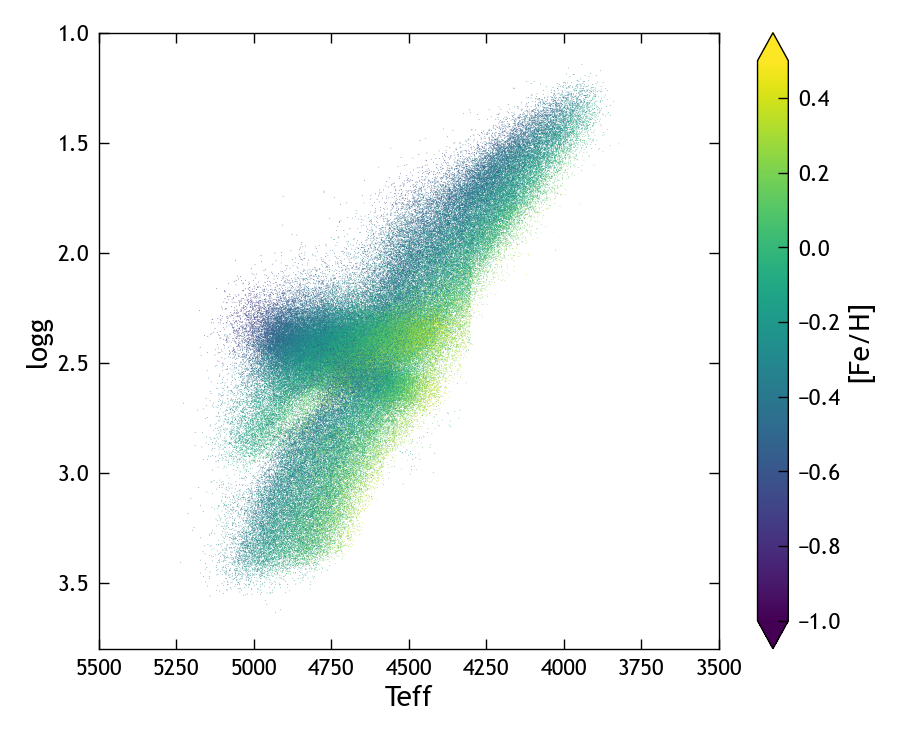

In [5]:
fig, ax = plt.subplots(figsize=(5, 4))
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')
pc = ax.scatter(mwm_rgb['teff'], mwm_rgb['logg'], c=mwm_rgb['fe_h'], vmin=-1, vmax=0.5, **kwargs)
fig.colorbar(pc, ax=ax, label='[Fe/H]', extend='both')
ax.set_xlim((5500, 3500))
ax.set_ylim((3.8, 1))
ax.set_xlabel('Teff')
ax.set_ylabel('logg')
plt.show()

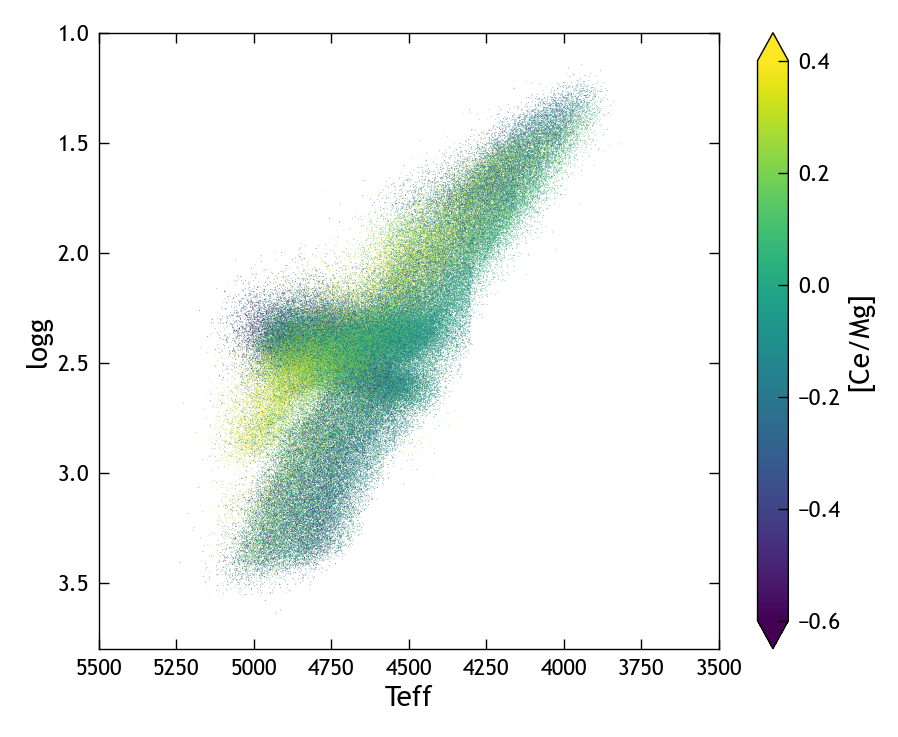

In [6]:
fig, ax = plt.subplots(figsize=(5, 4))
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')
pc = ax.scatter(mwm_rgb['teff'], mwm_rgb['logg'], c=mwm_rgb['ce_mg'], vmin=-0.6, vmax=0.4, **kwargs)
fig.colorbar(pc, ax=ax, label='[Ce/Mg]', extend='both')
ax.set_xlim((5500, 3500))
ax.set_ylim((3.8, 1))
ax.set_xlabel('Teff')
ax.set_ylabel('logg')
plt.show()

/var/folders/_s/lknhlnjn1g1cj388brpgztf80000gn/T/ipykernel_2751/3050921039.py:15: RuntimeWarning: invalid value encountered in divide
  axs[1].hist(bins[:-1], bins, weights=flag_hist / all_hist)



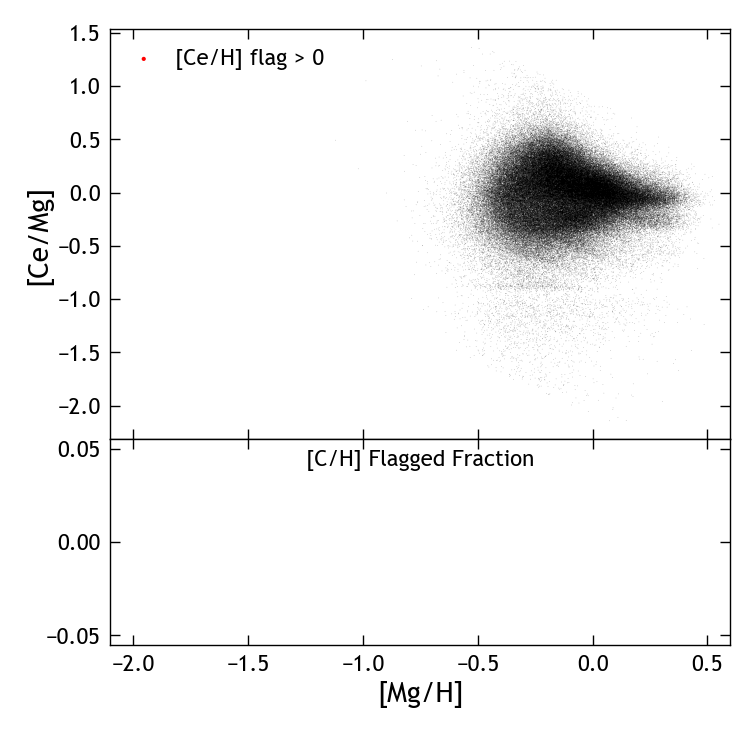

In [7]:
fig, axs = plt.subplots(2, sharex=True, gridspec_kw={'hspace': 0, 'height_ratios': (2, 1)})
xlim = (-2.1, 0.6)
axs[0].scatter(mwm_rgb['mg_h'], mwm_rgb['ce_mg'], c='k', alpha=0.3, **kwargs)
ce_flags = mwm_rgb[mwm_rgb['ce_h_flags'] > 0]
kwargs['s'] = 1
axs[0].scatter(ce_flags['mg_h'], ce_flags['ce_mg'], c='r', label='[Ce/H] flag > 0', **kwargs)
axs[0].set_xlim(xlim)
# axs[0].set_ylim((-1, 1))
axs[0].set_ylabel('[Ce/Mg]')
axs[0].legend(markerscale=3)

bins = 100
flag_hist, bins = np.histogram(ce_flags['mg_h'], range=xlim, bins=bins)
all_hist, bins = np.histogram(mwm_rgb['mg_h'], range=xlim, bins=bins)
axs[1].hist(bins[:-1], bins, weights=flag_hist / all_hist)
axs[1].set_xlabel('[Mg/H]')
axs[1].text(0.5, 0.95, '[C/H] Flagged Fraction', ha='center', va='top', transform=axs[1].transAxes)

plt.show()

## Solar Neighborhood

In [8]:
mwm_rgb_local = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 2)
]
mwm_rgb_local

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,e,parallax,ra_y,dec_y,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,ruwe,z_max,Rg
3,54381962,NaN,421557744554456064,421557744554456064,403393481,16025,tic_v8,25,27021597851161095,4291878605,...,0.023527,0.821440,5.742822,56.604244,11.354103,12.103177,10.509450,1.051452,0.107297,8.766076
16,54382295,NaN,421589183715747968,421589183715747968,327577724,16024,tic_v8,25,27021597850733418,4291449550,...,0.082842,0.621352,4.838551,56.535746,12.989830,13.689755,12.176354,1.093702,0.253124,8.840263
21,54382700,2M00200721+5700122,421625909974353280,421625914277199872,406762101,15668,gaia_dr3_source,31,63050394783245110,4291624784,...,0.126596,0.953161,5.030085,57.003410,11.962486,12.695877,11.121562,6.407218,0.183795,7.756411
49,54383757,2M00290801+5640111,421706109904337024,421706109904337024,320047050,16027,gaia_dr3_source,31,63050394783273185,4291910754,...,0.098802,0.726696,7.283335,56.669774,12.007926,12.807559,11.132788,4.010105,0.136858,8.739005
60,54384509,2M00271056+5654556,421762352496488832,421762352496488832,319844954,15670,gaia_dr3_source,31,63050394783292573,4291900981,...,0.098081,0.637712,6.794001,56.915434,12.128599,12.845614,11.306450,1.005274,0.154093,8.455453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181597,129060727,2M10455986-6014078,5254217214725965184,5254217214725965184,391155000,183791,gaia_dr3_source,31,63050395843775337,5771618716,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181602,129060768,2M09150089-4756448,5326450696258684032,5326450696258684032,461741387,171468,gaia_dr3_source,31,63050395876069826,5802236276,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181604,129060777,2M09120875-4832413,5326054081799907712,5326054081799907712,372916511,171914,gaia_dr3_source,31,63050395875989157,5802232075,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181612,129060864,2M09093978-4751104,5326886175877017088,5326886175877017088,74380758,171016,gaia_dr3_source,31,63050395876148699,5802260041,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
def alpha_cut(feh):
    """Returns [Mg/Fe] cut as function of [Fe/H]."""
    return np.where(
        feh >= 0.0,
        0.1,
        0.1 - 0.13*feh
    )

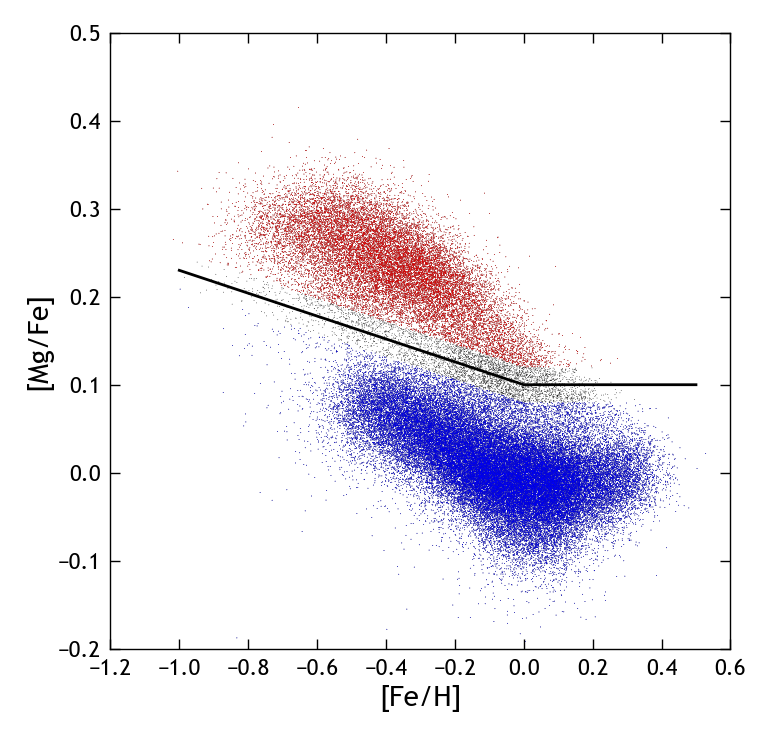

In [10]:
ms = 0.3

fig, ax = plt.subplots()
ax.scatter(
    mwm_rgb_local['fe_h'], mwm_rgb_local['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='k'
)
feh_arr = np.arange(-1., 0.51, 0.1)
ax.plot(feh_arr, alpha_cut(feh_arr), c='k')
# high-alpha
alpha_buffer = 0.02
local_high_alpha = mwm_rgb_local[
    mwm_rgb_local['mg_fe'] > alpha_cut(mwm_rgb_local['fe_h']) + alpha_buffer
]
ax.scatter(
    local_high_alpha['fe_h'], local_high_alpha['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='r'
)
# low-alpha
local_low_alpha = mwm_rgb_local[
    mwm_rgb_local['mg_fe'] < alpha_cut(mwm_rgb_local['fe_h']) - alpha_buffer
]
ax.scatter(
    local_low_alpha['fe_h'], local_low_alpha['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='b'
)
ax.set_xlabel('[Fe/H]')
ax.set_ylabel('[Mg/Fe]')
ax.set_xlim((-1.2, 0.6))
ax.set_ylim((-0.2, 0.5))
plt.show()

[]

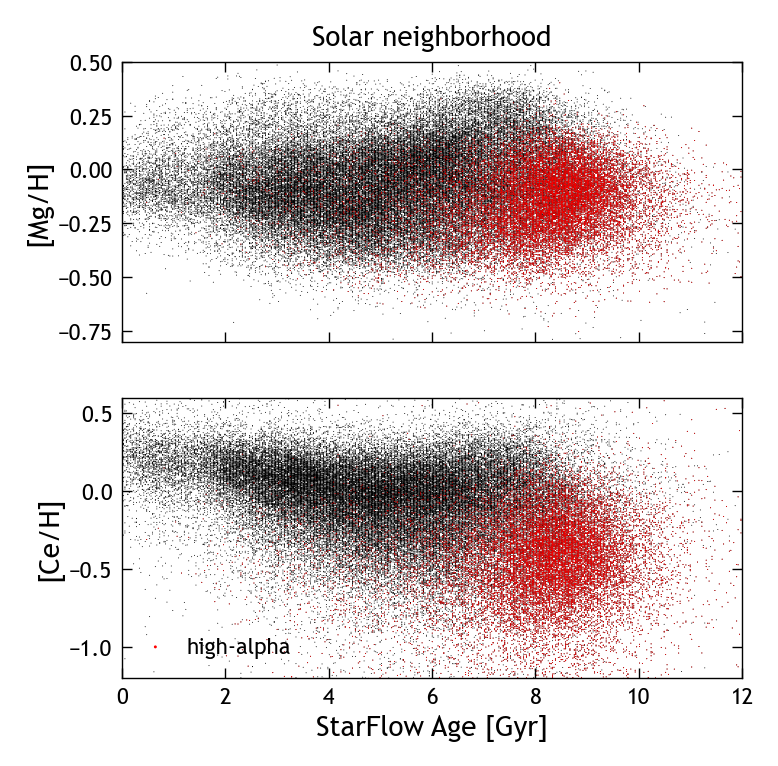

In [11]:
fig, axs = plt.subplots(2, sharex=True)
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')

axs[0].scatter(mwm_rgb_local['age'], mwm_rgb_local['mg_h'], c='k', **kwargs)
axs[0].scatter(local_high_alpha['age'], local_high_alpha['mg_h'], c='r', label='high-alpha', **kwargs)
axs[1].scatter(mwm_rgb_local['age'], mwm_rgb_local['ce_h'], c='k', **kwargs)
axs[1].scatter(local_high_alpha['age'], local_high_alpha['ce_h'], c='r', label='high-alpha', **kwargs)

axs[0].set_xlim((0, 12))
axs[0].set_ylim((-0.8, 0.5))
axs[1].set_ylim((-1.2, 0.6))

axs[0].set_ylabel('[Mg/H]')
axs[1].set_ylabel('[Ce/H]')
axs[1].set_xlabel('StarFlow Age [Gyr]')

axs[1].legend(markerscale=3)
axs[0].set_title('Solar neighborhood')

plt.plot()

In [12]:
def binned_medians(data, col, bin_col, bins=50):
    """
    Calculate median trends in bins of a second parameter.
    
    Parameters
    ----------
    col : str
        Data column corresponding to the first parameter, for which the
        intervals will be calculated in each bin.
    bin_col : str
        Data column corresponding to the second (binning) parameter.
    bins : int, optional
        The number of equal-size bins to divide the data along bin_col.
        The default is 50.
    
    Returns
    -------
    bin_centers : numpy.ndarray
        Center of each bin in bin_col.
    medians : numpy.ndarray
        Median values of col in each bin.
    """
    data = data.dropna(subset=col)
    bin_edges = np.linspace(data[bin_col].min(), data[bin_col].max(), bins+1)
    bin_centers = get_bin_centers(bin_edges)
    grouped = data.groupby(pd.cut(data[bin_col], bin_edges), observed=False)[col]
    return bin_centers, grouped.median().to_numpy()

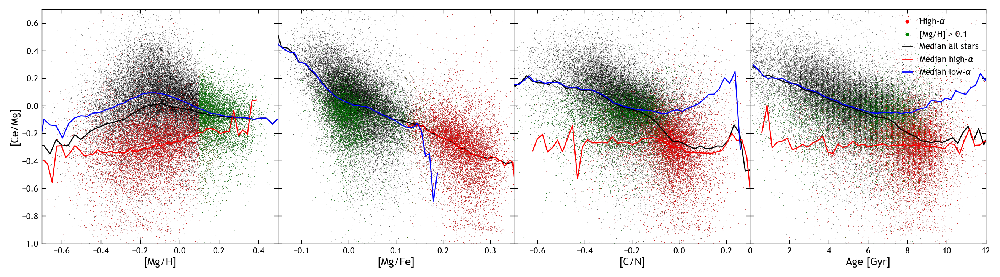

In [13]:
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')
local_metal_rich = mwm_rgb_local[mwm_rgb_local['mg_h'] > 0.1]

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True, gridspec_kw={'wspace': 0.})

xcols = ['mg_h', 'mg_fe', 'c_n', 'age']
ycol = 'ce_mg'
for i, xcol in enumerate(xcols):
    # Full sample
    axs[i].scatter(mwm_rgb_local[xcol], mwm_rgb_local[ycol], c='k', **kwargs)
    # High-alpha
    axs[i].scatter(local_high_alpha[xcol], local_high_alpha[ycol], c='r', **kwargs, label=r'High-$\alpha$')
    # Local metal-rich
    axs[i].scatter(local_metal_rich[xcol], local_metal_rich[ycol], c='g', **kwargs, label='[Mg/H] > 0.1')
    # Median trends
    axs[i].plot(*binned_medians(mwm_rgb_local, ycol, xcol), 'k-', label=r'Median all stars')
    axs[i].plot(*binned_medians(local_high_alpha, ycol, xcol), 'r-', label=r'Median high-$\alpha$')
    axs[i].plot(*binned_medians(local_low_alpha, ycol, xcol), 'b-', label=r'Median low-$\alpha$')

axs[0].set_ylabel('[Ce/Mg]')
axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/Fe]')
axs[2].set_xlabel('[C/N]')
axs[3].set_xlabel('Age [Gyr]')

axs[0].set_ylim((-1, 0.7))
axs[0].set_xlim((-0.7, 0.5))
axs[1].set_xlim((-0.15, 0.35))
axs[2].set_xlim((-0.7, 0.3))
axs[3].set_xlim((0, 12))

axs[3].legend(markerscale=10, loc='upper right')

plt.show()

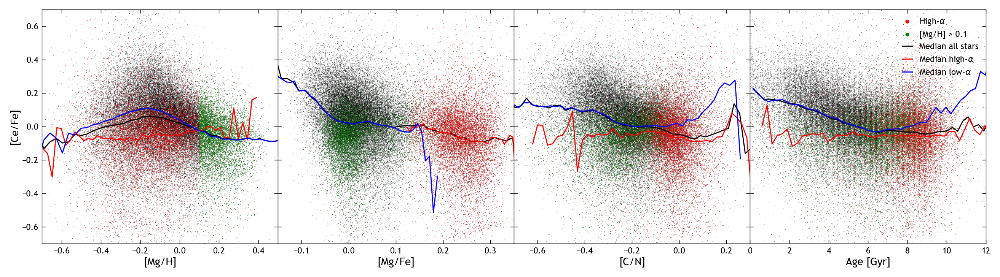

In [14]:
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True, gridspec_kw={'wspace': 0.})

xcols = ['mg_h', 'mg_fe', 'c_n', 'age']
ycol = 'ce_fe'
for i, xcol in enumerate(xcols):
    # Full sample
    axs[i].scatter(mwm_rgb_local[xcol], mwm_rgb_local[ycol], c='k', **kwargs)
    # High-alpha
    axs[i].scatter(local_high_alpha[xcol], local_high_alpha[ycol], c='r', **kwargs, label=r'High-$\alpha$')
    # Local metal-rich
    axs[i].scatter(local_metal_rich[xcol], local_metal_rich[ycol], c='g', **kwargs, label='[Mg/H] > 0.1')
    # Median trends
    axs[i].plot(*binned_medians(mwm_rgb_local, ycol, xcol), 'k-', label=r'Median all stars')
    axs[i].plot(*binned_medians(local_high_alpha, ycol, xcol), 'r-', label=r'Median high-$\alpha$')
    axs[i].plot(*binned_medians(local_low_alpha, ycol, xcol), 'b-', label=r'Median low-$\alpha$')

axs[0].set_ylabel('[Ce/Fe]')
axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/Fe]')
axs[2].set_xlabel('[C/N]')
axs[3].set_xlabel('Age [Gyr]')

axs[0].set_ylim((-0.7, 0.7))
axs[0].set_xlim((-0.7, 0.5))
axs[1].set_xlim((-0.15, 0.35))
axs[2].set_xlim((-0.7, 0.3))
axs[3].set_xlim((0, 12))

axs[3].legend(markerscale=10, loc='upper right')

plt.show()

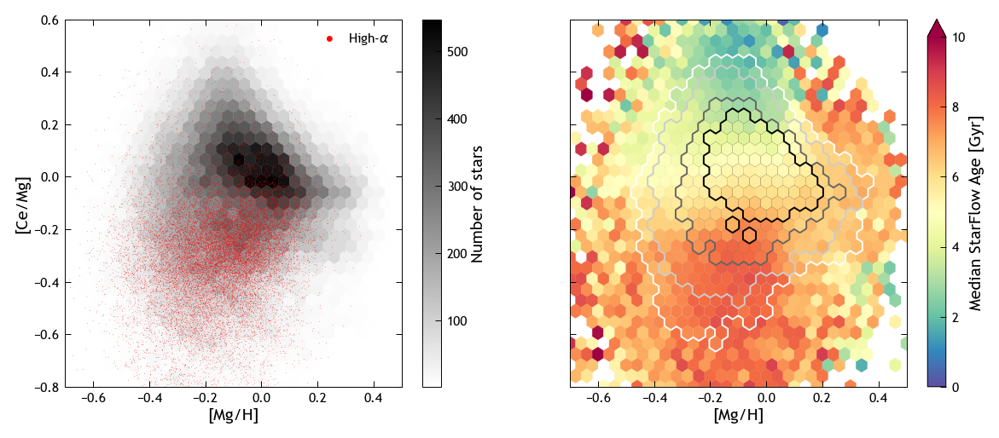

In [15]:
gridsize = 30
xlim = (-0.7, 0.5)
ylim = (-0.8, 0.6)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=140, sharex=True, sharey=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['mg_h'], mwm_rgb_local['ce_mg'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
# Indicate high-alpha stars
axs[0].scatter(
    local_high_alpha['mg_h'], local_high_alpha['ce_mg'], 
    s=0.5, marker='.', rasterized=True, edgecolor='none', c='r',
    label = r'High-$\alpha$'
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')
axs[0].legend(frameon=False, markerscale=10)

# Plot median age
cfg = dict(
    x=mwm_rgb_local['mg_h'], 
    y=mwm_rgb_local['ce_mg'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300]
# colors = ['#cccccc', '#999999', '#666666', '#333333', '#000000']
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/H]')
axs[0].set_ylabel('[Ce/Mg]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
plt.show()

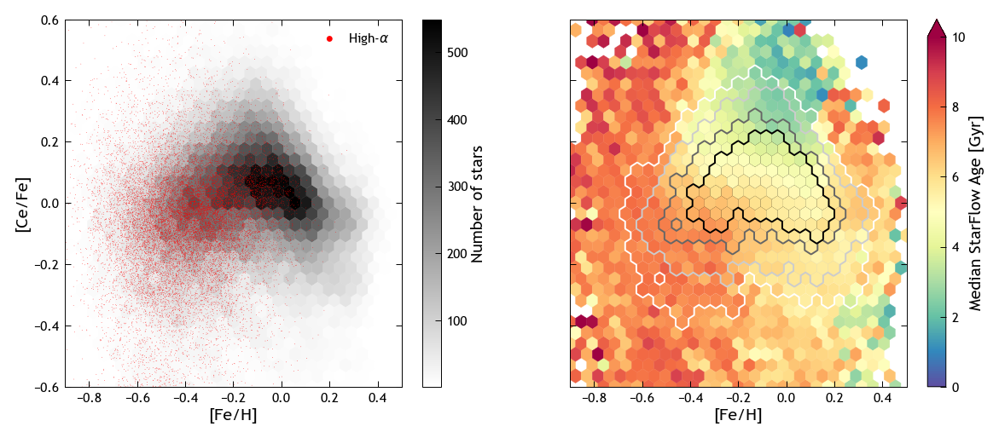

In [16]:
gridsize = 30
xlim = (-0.9, 0.5)
ylim = (-0.6, 0.6)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=140, sharex=True, sharey=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['fe_h'], mwm_rgb_local['ce_fe'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
# Indicate high-alpha stars
axs[0].scatter(
    local_high_alpha['fe_h'], local_high_alpha['ce_fe'], 
    s=0.5, marker='.', rasterized=True, edgecolor='none', c='r',
    label = r'High-$\alpha$'
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')
axs[0].legend(frameon=False, markerscale=10)

# Plot median age
cfg = dict(
    x=mwm_rgb_local['fe_h'], 
    y=mwm_rgb_local['ce_fe'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300]
# colors = ['#cccccc', '#999999', '#666666', '#333333', '#000000']
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Fe/H]')
axs[1].set_xlabel('[Fe/H]')
axs[0].set_ylabel('[Ce/Fe]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
plt.show()

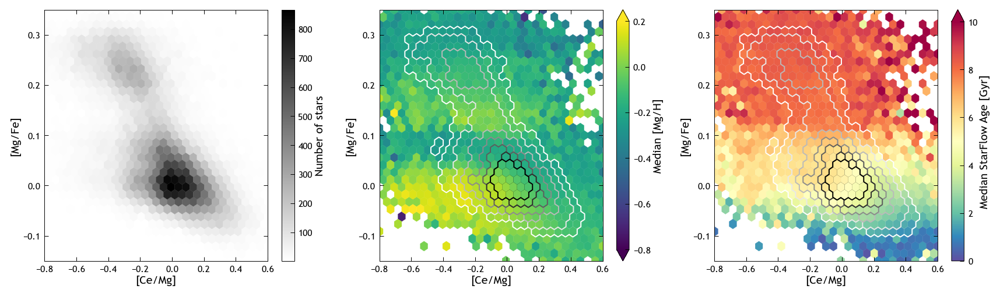

In [17]:
gridsize = 30
ylim = (-0.15, 0.35)
xlim = (-0.8, 0.6)

fig, axs = plt.subplots(1, 3, figsize=(15, 4), dpi=140, sharex=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['ce_mg'], mwm_rgb_local['mg_fe'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')

# Color by metallicity
cfg = dict(
    x=mwm_rgb_local['ce_mg'], 
    y=mwm_rgb_local['mg_fe'], 
    C=mwm_rgb_local['mg_h'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='viridis',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=-0.8, vmax=0.2)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300, 400, 500, 600]
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='both')
cbar.ax.set_ylabel('Median [Mg/H]')

# Color by median [C/N]
cfg = dict(
    x=mwm_rgb_local['ce_mg'], 
    y=mwm_rgb_local['mg_fe'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[2].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[2].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[2].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[2], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Ce/Mg]')
axs[1].set_xlabel('[Ce/Mg]')
axs[2].set_xlabel('[Ce/Mg]')
axs[0].set_ylabel('[Mg/Fe]')
axs[1].set_ylabel('[Mg/Fe]')
axs[2].set_ylabel('[Mg/Fe]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
axs[1].set_ylim(ylim)
axs[2].set_ylim(ylim)
plt.show()

Trends at lower metallicity

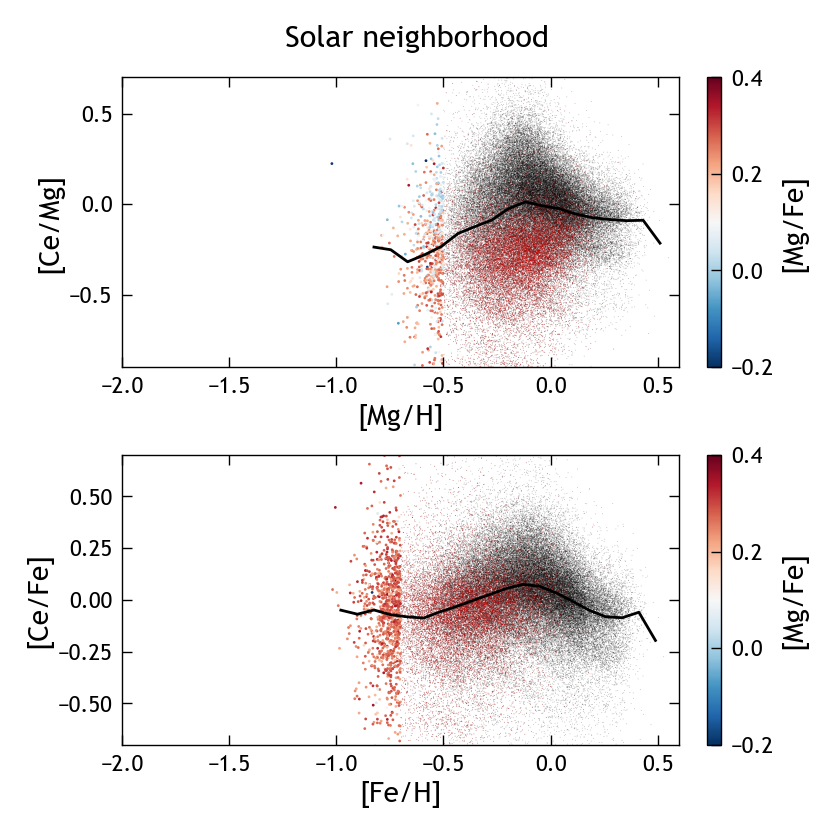

In [18]:
low_mgh = mwm_rgb_local[mwm_rgb_local['mg_h'] < -0.5]
low_feh = mwm_rgb_local[mwm_rgb_local['fe_h'] < -0.7]

fig, axs = plt.subplots(2, constrained_layout=True)
fig.suptitle('Solar neighborhood')
axs[0].scatter(mwm_rgb_local['mg_h'], mwm_rgb_local['ce_mg'],
               c='k', s=0.1, edgecolor='none', alpha=0.3)
axs[0].scatter(local_high_alpha['mg_h'], local_high_alpha['ce_mg'],
               c='r', s=0.1, edgecolor='none', alpha=0.3, label='High-alpha')
pc = axs[0].scatter(low_mgh['mg_h'], low_mgh['ce_mg'], c=low_mgh['mg_fe'],
               s=1, edgecolor='none', cmap='RdBu_r', vmin=-0.2, vmax=0.4)
fig.colorbar(pc, ax=axs[0], label='[Mg/Fe]')
axs[0].plot(*binned_medians(mwm_rgb_local, 'ce_mg', 'mg_h', bins=20), 'k-')

axs[1].scatter(mwm_rgb_local['fe_h'], mwm_rgb_local['ce_fe'],
               c='k', s=0.1, edgecolor='none', alpha=0.3)
axs[1].scatter(local_high_alpha['fe_h'], local_high_alpha['ce_fe'],
               c='r', s=0.1, edgecolor='none', alpha=0.3, label='High-alpha')
pc = axs[1].scatter(low_feh['fe_h'], low_feh['ce_fe'], c=low_feh['mg_fe'], 
                    s=1, edgecolor='none', cmap='RdBu_r', vmin=-0.2, vmax=0.4)
fig.colorbar(pc, ax=axs[1], label='[Mg/Fe]')
axs[1].plot(*binned_medians(mwm_rgb_local, 'ce_fe', 'fe_h', bins=20), 'k-')

axs[0].set_xlim((-2, 0.6))
axs[0].set_ylim((-0.9, 0.7))
axs[0].set_xlabel('[Mg/H]')
axs[0].set_ylabel('[Ce/Mg]')
axs[1].set_xlim((-2, 0.6))
axs[1].set_ylim((-0.7, 0.7))
axs[1].set_xlabel('[Fe/H]')
axs[1].set_ylabel('[Ce/Fe]')

plt.show()

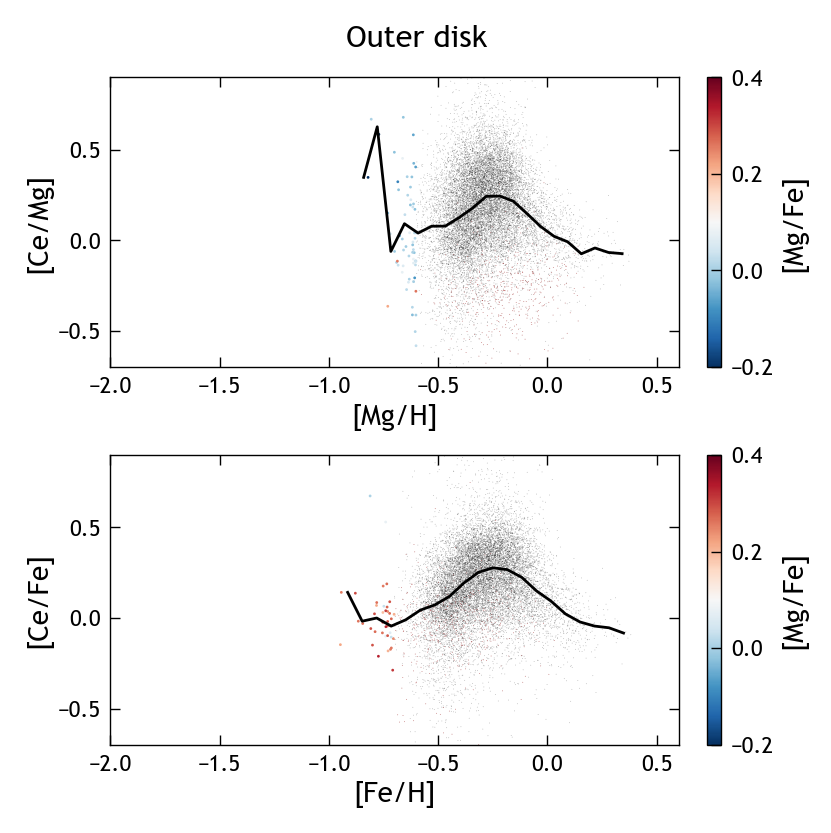

In [19]:
mwm_rgb_outer = mwm_rgb[
    (mwm_rgb['gal_r'] >= 11) &
    (mwm_rgb['gal_r'] < 15) &
    (mwm_rgb['gal_z'].abs() < 3)
]
alpha_buffer = 0.02
outer_high_alpha = mwm_rgb_outer[
    mwm_rgb_outer['mg_fe'] > alpha_cut(mwm_rgb_outer['fe_h']) + alpha_buffer
]
low_mgh = mwm_rgb_outer[mwm_rgb_outer['mg_h'] < -0.6]
low_feh = mwm_rgb_outer[mwm_rgb_outer['fe_h'] < -0.7]

fig, axs = plt.subplots(2, constrained_layout=True)
fig.suptitle('Outer disk')
axs[0].scatter(mwm_rgb_outer['mg_h'], mwm_rgb_outer['ce_mg'],
               c='k', s=0.1, edgecolor='none', alpha=0.3)
axs[0].scatter(outer_high_alpha['mg_h'], outer_high_alpha['ce_mg'],
               c='r', s=0.1, edgecolor='none', alpha=0.3, label='High-alpha')
pc = axs[0].scatter(low_mgh['mg_h'], low_mgh['ce_mg'], c=low_mgh['mg_fe'],
               s=1, edgecolor='none', cmap='RdBu_r', vmin=-0.2, vmax=0.4)
fig.colorbar(pc, ax=axs[0], label='[Mg/Fe]')
axs[0].plot(*binned_medians(mwm_rgb_outer, 'ce_mg', 'mg_h', bins=20), 'k-')

axs[1].scatter(mwm_rgb_outer['fe_h'], mwm_rgb_outer['ce_fe'],
               c='k', s=0.1, edgecolor='none', alpha=0.3)
axs[1].scatter(outer_high_alpha['fe_h'], outer_high_alpha['ce_fe'],
               c='r', s=0.1, edgecolor='none', alpha=0.3, label='High-alpha')
pc = axs[1].scatter(low_feh['fe_h'], low_feh['ce_fe'], c=low_feh['mg_fe'], 
                    s=1, edgecolor='none', cmap='RdBu_r', vmin=-0.2, vmax=0.4)
fig.colorbar(pc, ax=axs[1], label='[Mg/Fe]')
axs[1].plot(*binned_medians(mwm_rgb_outer, 'ce_fe', 'fe_h', bins=20), 'k-')

axs[0].set_xlim((-2, 0.6))
axs[0].set_ylim((-0.7, 0.9))
axs[0].set_xlabel('[Mg/H]')
axs[0].set_ylabel('[Ce/Mg]')
axs[1].set_xlim((-2, 0.6))
axs[1].set_ylim((-0.7, 0.9))
axs[1].set_xlabel('[Fe/H]')
axs[1].set_ylabel('[Ce/Fe]')

plt.show()

## Across the disk

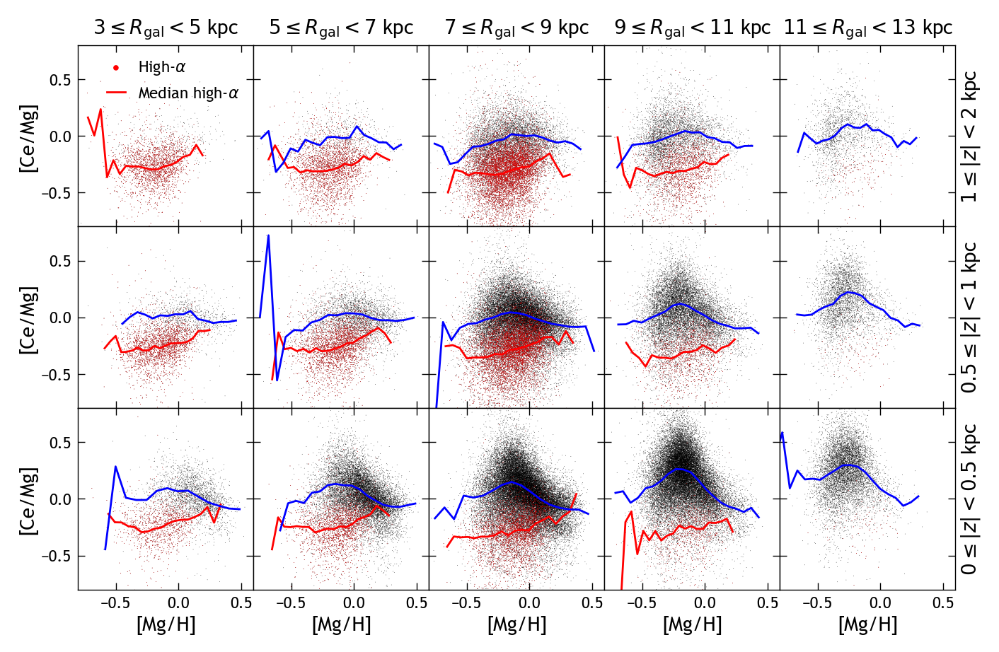

In [20]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['mg_h'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        ax.scatter(high_alpha['mg_h'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)
        # Plot median trends
        if high_alpha.shape[0] >= 200:
            ax.plot(*binned_medians(high_alpha, 'ce_mg', 'mg_h', 20), 'r-',
                    label=r'Median high-$\alpha$')
        if low_alpha.shape[0] >= 200:
            ax.plot(*binned_medians(low_alpha, 'ce_mg', 'mg_h', 20), 'b-',
                    label=r'Median low-$\alpha$')

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

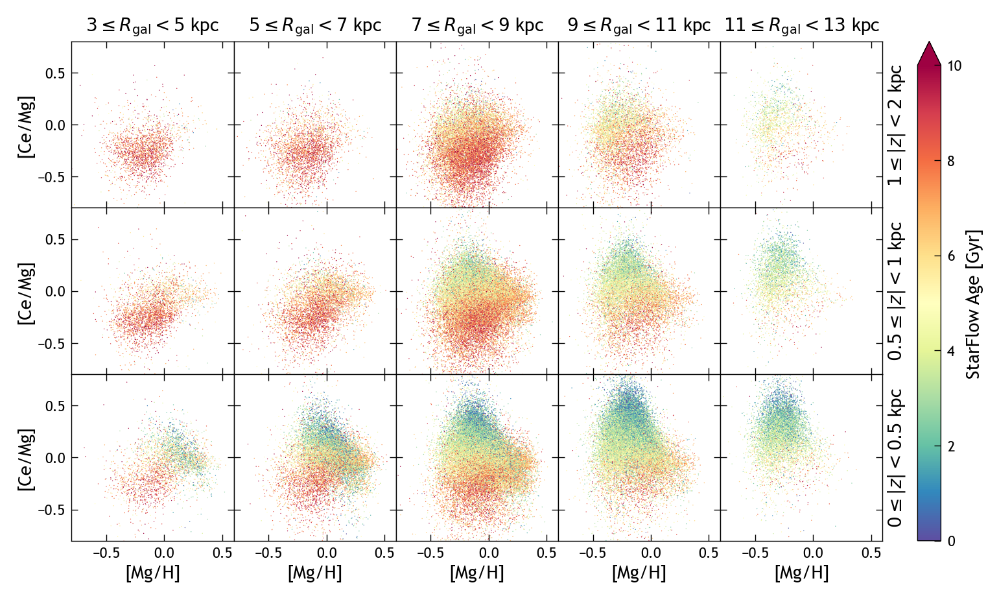

In [21]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=1, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(9, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        pc = ax.scatter(subset['mg_h'], subset['ce_mg'], c=subset['age'], 
                   vmin=0, vmax=10, cmap='Spectral_r', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))

# Colorbar
width = 0.02
pad = 0.03
plt.subplots_adjust(right=fig.subplotpars.right - (width + pad + 0.03))
height = fig.subplotpars.top - fig.subplotpars.bottom
cax = plt.axes([fig.subplotpars.right + pad, fig.subplotpars.bottom, 
                width, height])
fig.colorbar(pc, cax=cax, extend='max', label='StarFlow Age [Gyr]')

plt.show()

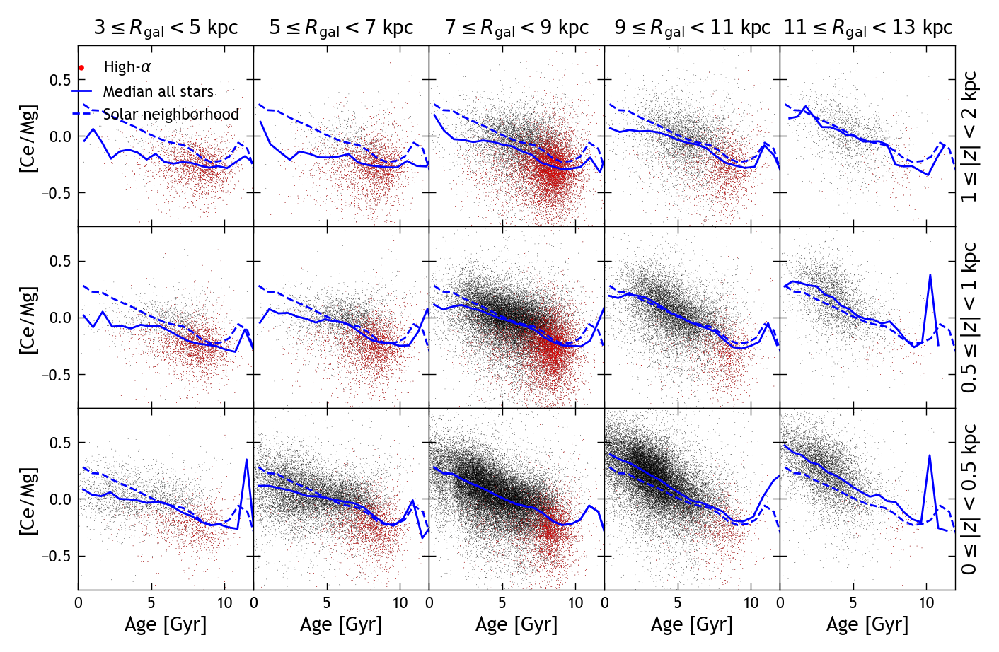

In [22]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

local_subset = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 0.5)
]

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['age'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        ax.scatter(high_alpha['age'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)
        # Plot median trends
        ax.plot(*binned_medians(subset, 'ce_mg', 'age', 20), 'b-',
                label=r'Median all stars')
        # Local medians for comparison
        ax.plot(*binned_medians(local_subset, 'ce_mg', 'age', 20), 'b--',
                label='Solar neighborhood')

# Format axes
axs[0,0].set_xlim((0, 12))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('Age [Gyr]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

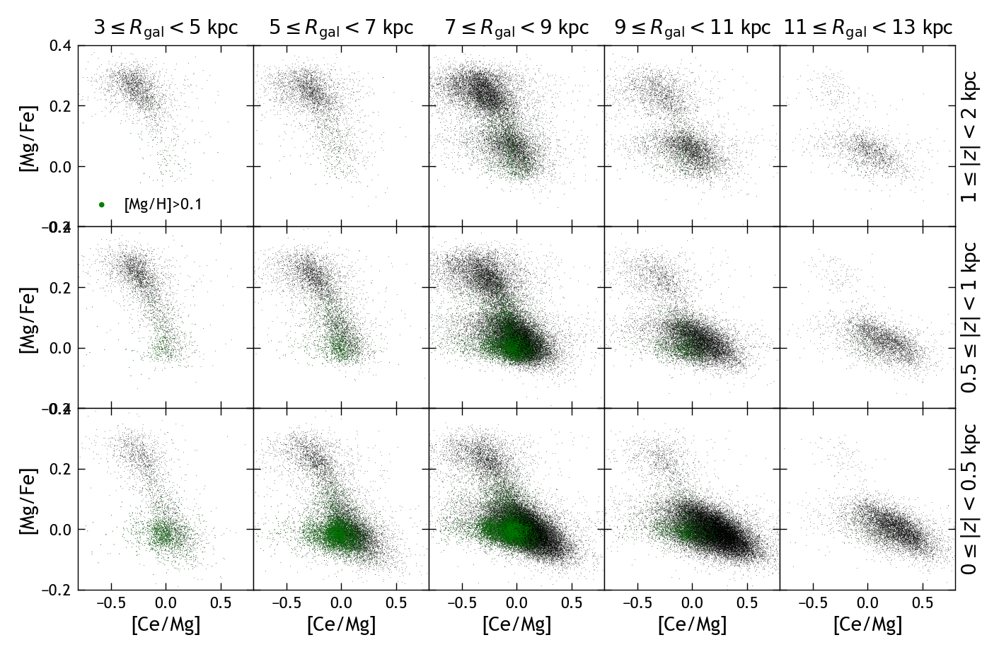

In [23]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0}
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['ce_mg'], subset['mg_fe'], c='k', **kwargs)
        # high_alpha = subset[
        #     subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        # ]
        # ax.scatter(high_alpha['ce_mg'], high_alpha['mg_fe'], c='r', 
        #            label=r'High-$\alpha$', **kwargs)
        metal_rich = subset[subset['mg_h'] > 0.1]
        ax.scatter(metal_rich['ce_mg'], metal_rich['mg_fe'], c='g',
                   label='[Mg/H]>0.1', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.8))
axs[0,0].set_ylim((-0.2, 0.4))
for ax in axs[-1,:]:
    ax.set_xlabel('[Ce/Mg]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Mg/Fe]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

## Residual abundances

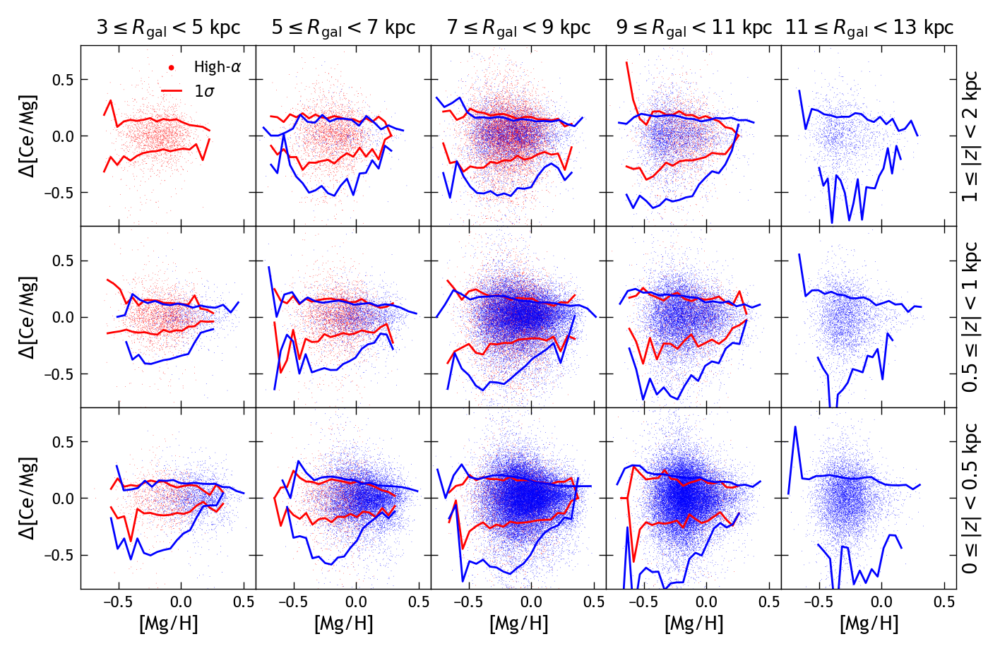

In [41]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1]) &
            (mwm_rgb['mg_h'] > -0.8)
        ]
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        # Calculate
        if high_alpha.shape[0] >= 200:
            high_alpha_medians = binned_medians(high_alpha, 'ce_mg', 'mg_h', 20)
            interp_median = np.interp(high_alpha['mg_h'], *high_alpha_medians)
            ax.scatter(
                high_alpha['mg_h'], 
                high_alpha['ce_mg'] - interp_median, 
                c='r', 
                label=r'High-$\alpha$', 
                **kwargs
            )
            high_alpha_q1 = binned_quantiles(high_alpha, 'ce_mg', 'mg_h', 20, q=0.84)
            ax.plot(high_alpha_q1[0], high_alpha_q1[1] - high_alpha_medians[1], 'r-', label=r'$1\sigma$')
            high_alpha_q2 = binned_quantiles(high_alpha, 'ce_mg', 'mg_h', 20, q=0.16)
            ax.plot(high_alpha_q2[0], high_alpha_q2[1] - high_alpha_medians[1], 'r-')
            
        if low_alpha.shape[0] >= 200:
            low_alpha_medians = binned_medians(low_alpha, 'ce_mg', 'mg_h', 20)
            interp_median = np.interp(low_alpha['mg_h'], *low_alpha_medians)
            ax.scatter(
                low_alpha['mg_h'], 
                low_alpha['ce_mg'] - interp_median, 
                c='b', 
                label=r'Low-$\alpha$', 
                **kwargs
            )
            low_alpha_q1 = binned_quantiles(low_alpha, 'ce_mg', 'mg_h', 20, q=0.84)
            ax.plot(low_alpha_q1[0], low_alpha_q1[1] - low_alpha_medians[1], 'b-', label=r'$1\sigma$')
            low_alpha_q2 = binned_quantiles(high_alpha, 'ce_mg', 'mg_h', 20, q=0.16)
            ax.plot(low_alpha_q2[0], low_alpha_q2[1] - low_alpha_medians[1], 'b-')

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel(r'$\Delta$[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

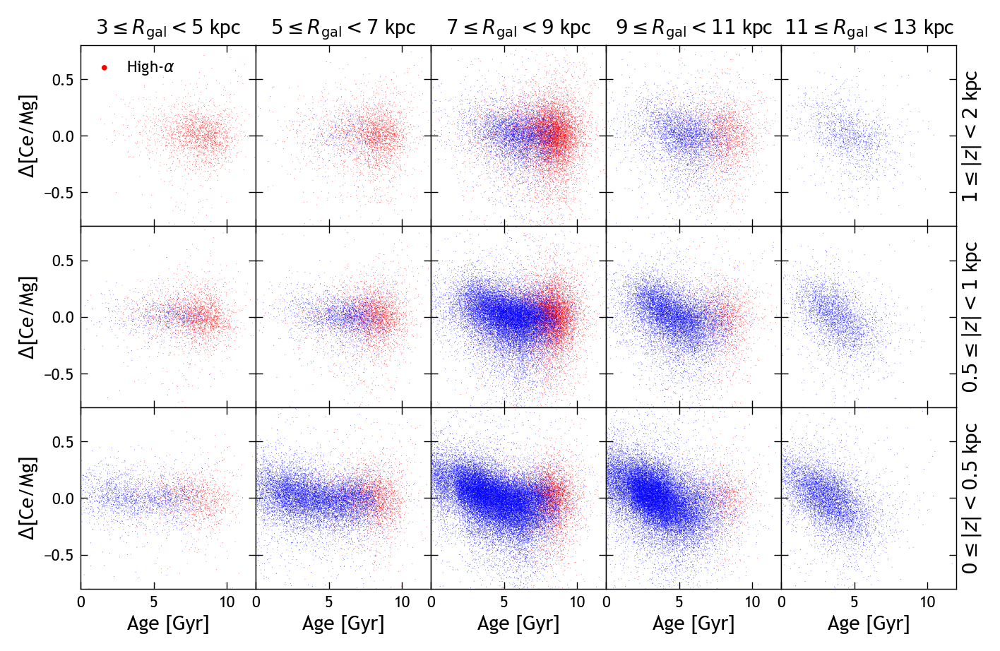

In [25]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1]) &
            (mwm_rgb['mg_h'] > -0.8)
        ]
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        # Calculate
        if high_alpha.shape[0] >= 200:
            high_alpha_medians = binned_medians(high_alpha, 'ce_mg', 'mg_h', 20)
            ax.scatter(
                high_alpha['age'], 
                high_alpha['ce_mg'] - np.interp(high_alpha['mg_h'], *high_alpha_medians), 
                c='r', 
                label=r'High-$\alpha$', 
                **kwargs
            )
        if low_alpha.shape[0] >= 200:
            low_alpha_medians = binned_medians(low_alpha, 'ce_mg', 'mg_h', 20)
            ax.scatter(
                low_alpha['age'], 
                low_alpha['ce_mg'] - np.interp(low_alpha['mg_h'], *low_alpha_medians), 
                c='b', 
                label=r'Low-$\alpha$', 
                **kwargs
            )

# Format axes
axs[0,0].set_xlim((0, 12))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('Age [Gyr]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel(r'$\Delta$[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

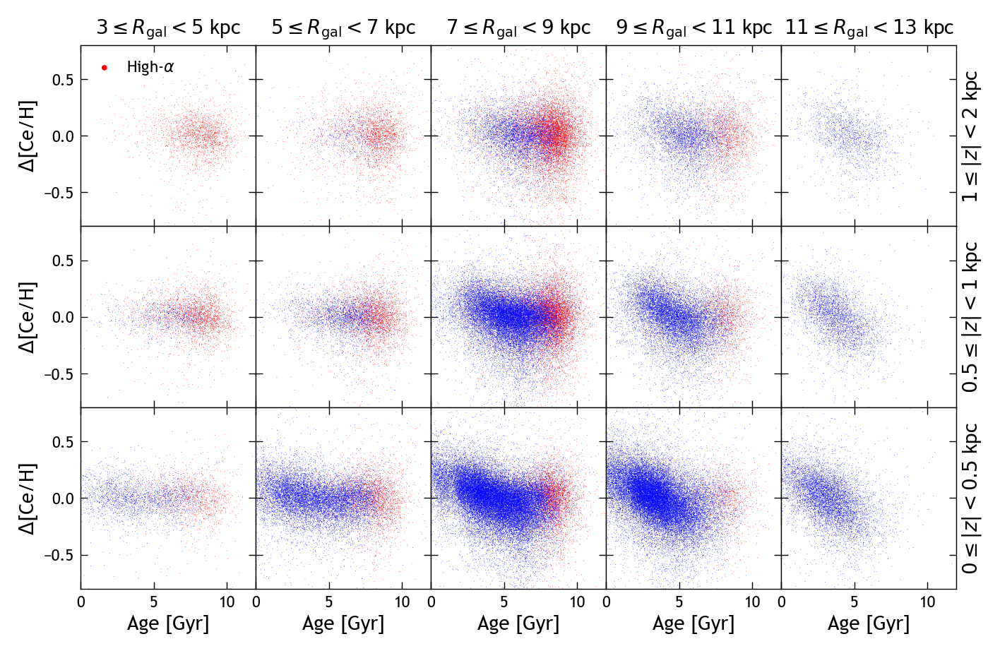

In [44]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1]) &
            (mwm_rgb['mg_h'] > -0.8)
        ]
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        # Calculate
        if high_alpha.shape[0] >= 200:
            high_alpha_medians = binned_medians(high_alpha, 'ce_h', 'mg_h', 20)
            ax.scatter(
                high_alpha['age'], 
                high_alpha['ce_h'] - np.interp(high_alpha['mg_h'], *high_alpha_medians), 
                c='r', 
                label=r'High-$\alpha$', 
                **kwargs
            )
        if low_alpha.shape[0] >= 200:
            low_alpha_medians = binned_medians(low_alpha, 'ce_h', 'mg_h', 20)
            ax.scatter(
                low_alpha['age'], 
                low_alpha['ce_h'] - np.interp(low_alpha['mg_h'], *low_alpha_medians), 
                c='b', 
                label=r'Low-$\alpha$', 
                **kwargs
            )

# Format axes
axs[0,0].set_xlim((0, 12))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('Age [Gyr]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel(r'$\Delta$[Ce/H]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

## Controlling for metallicity

599
1580
2658
4016
5590
6519
6464
4490
2401
1121


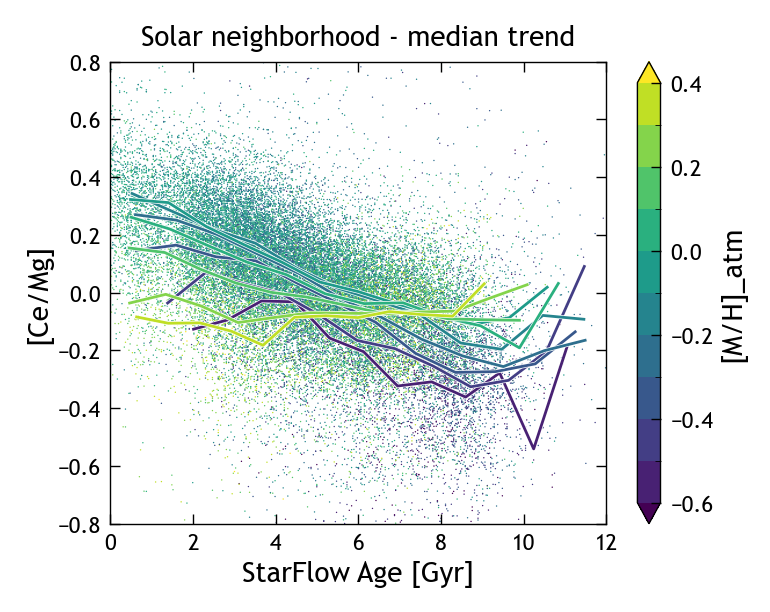

In [26]:
fig, ax = plt.subplots(figsize=(4, 3))

met_col = 'm_h_atm' # column with metallicity data
met_label = '[M/H]_atm'
met_bins = np.arange(-0.6, 0.5, 0.1)
max_age = 12

local_subset = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 0.5)
]

cmap = plt.get_cmap('viridis')
norm = BoundaryNorm(met_bins, cmap.N, extend='both')
pc = ax.scatter(
    local_subset['age'], local_subset['ce_mg'], c=local_subset[met_col], 
    cmap=cmap, norm=norm,
    s=1, marker='.', rasterized=True, edgecolor='none'
)
cbar = fig.colorbar(pc, ax=ax, label=met_label)

# Bin by metallicity and plot median trend
for i in range(len(met_bins)-1):
    met_lim = met_bins[i:i+2]
    subset = local_subset[
        (local_subset[met_col] >= met_lim[0]) & 
        (local_subset[met_col] < met_lim[1]) &
        (local_subset['age'] < max_age)
    ]
    print(subset.shape[0])
    medians = binned_medians(subset, 'ce_mg', 'age', max_age)
    ax.plot(*medians, linestyle='-', linewidth=1.5, color='w')
    ax.plot(
        *medians, 
        linestyle='-', linewidth=1, color=cmap(norm(met_lim[0]))
    )

ax.set_xlim((0, max_age))
ax.set_ylim((-0.8, 0.8))
ax.set_xlabel('StarFlow Age [Gyr]')
ax.set_ylabel('[Ce/Mg]')
ax.set_title('Solar neighborhood - median trend')

plt.show()

555
2241
5526
10828
18984
23059
25660
26325
23302
19148
13189
8110
3914


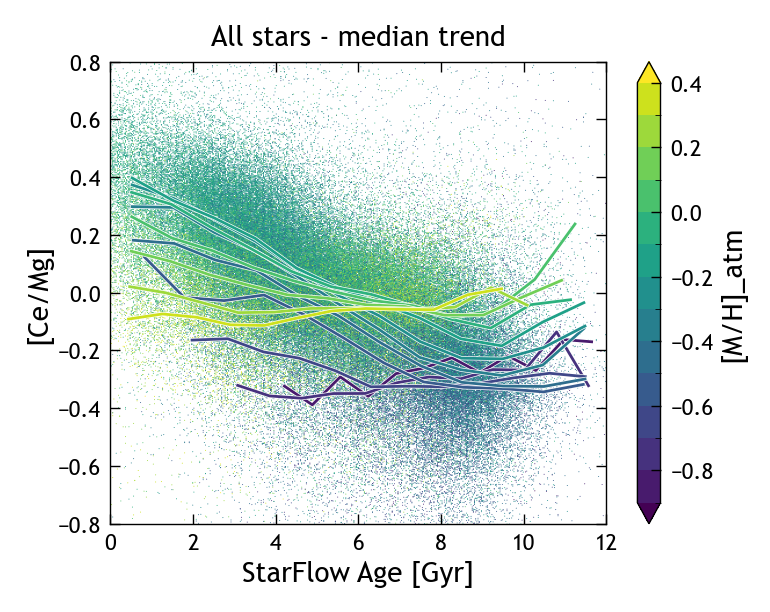

In [27]:
fig, ax = plt.subplots(figsize=(4, 3))

met_col = 'm_h_atm' # column with metallicity data
met_label = '[M/H]_atm'
met_bins = np.arange(-0.9, 0.5, 0.1)
max_age = 12

cmap = plt.get_cmap('viridis')
norm = BoundaryNorm(met_bins, cmap.N, extend='both')
pc = ax.scatter(
    mwm_rgb['age'], mwm_rgb['ce_mg'], c=mwm_rgb[met_col], 
    cmap=cmap, norm=norm,
    s=0.5, marker='.', rasterized=True, edgecolor='none'
)
cbar = fig.colorbar(pc, ax=ax, label=met_label)

# Bin by metallicity and plot median trend
# mgh_bins = np.append(np.insert(mgh_bins, 0, -1), 1) # extended high and low bins
for i in range(len(met_bins)-1):
    met_lim = met_bins[i:i+2]
    subset = mwm_rgb[
        (mwm_rgb[met_col] >= met_lim[0]) & 
        (mwm_rgb[met_col] < met_lim[1]) &
        (mwm_rgb['age'] < max_age)
    ]
    print(subset.shape[0])
    medians = binned_medians(subset, 'ce_mg', 'age', max_age)
    ax.plot(*medians, linestyle='-', linewidth=1.5, color='w')
    ax.plot(
        *medians, 
        linestyle='-', linewidth=1, color=cmap(norm(met_lim[0]))
    )

ax.set_xlim((0, max_age))
ax.set_ylim((-0.8, 0.8))
ax.set_xlabel('StarFlow Age [Gyr]')
ax.set_ylabel('[Ce/Mg]')
ax.set_title('All stars - median trend')

plt.show()

0.12619615194427905
0.15162778746375608
-0.04661970861842988
-0.32994288358955703
-0.4665750001816241
-0.5574996805069133
-0.6105189946226709
-0.5977853052449266
-0.5710049604020097
-0.43767897944268364
-0.31670693794159066
-0.07505291526006072
0.09146667662025522


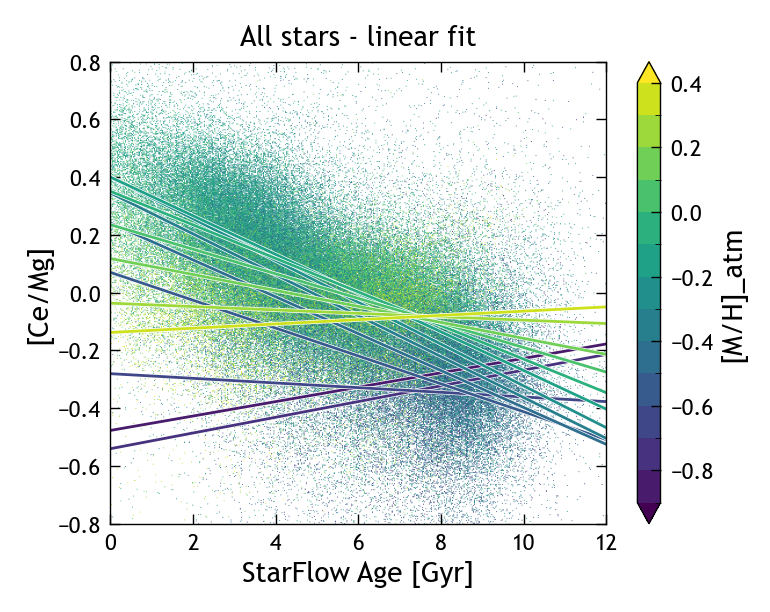

In [28]:
fig, ax = plt.subplots(figsize=(4, 3))

met_col = 'm_h_atm' # column with metallicity data
met_label = '[M/H]_atm'
met_bins = np.arange(-0.9, 0.5, 0.1)
age_arr = np.arange(0, 12.1, 0.1)
max_age = 12 # for linear fits

cmap = plt.get_cmap('viridis')
norm = BoundaryNorm(met_bins, cmap.N, extend='both')

pc = ax.scatter(
    mwm_rgb['age'], mwm_rgb['ce_mg'], c=mwm_rgb[met_col], 
    cmap=cmap, norm=norm,
    s=0.5, marker='.', rasterized=True, edgecolor='none'
)
cbar = fig.colorbar(pc, ax=ax, label=met_label)

# Bin by metallicity and fit linear trend to all stars
fits_all = []
for i in range(len(met_bins)-1):
    met_lim = met_bins[i:i+2]
    subset = mwm_rgb[
        (mwm_rgb[met_col] >= met_lim[0]) & 
        (mwm_rgb[met_col] < met_lim[1]) &
        (mwm_rgb['age'] < max_age)
    ]
    regress = stats.linregress(subset['age'], subset['ce_mg'])
    fits_all.append(regress)
    print(regress.rvalue)
    # Plot linear regression
    yfit = age_arr * regress.slope + regress.intercept
    ax.plot(age_arr, yfit, linestyle='-', linewidth=1.5, color='w')
    ax.plot(
        age_arr, yfit, 
        linestyle='-', linewidth=1, color=cmap(norm(met_lim[0]))
    )

ax.set_xlim((0, max_age))
ax.set_ylim((-0.8, 0.8))
ax.set_xlabel('StarFlow Age [Gyr]')
ax.set_ylabel('[Ce/Mg]')
ax.set_title('All stars - linear fit')

plt.show()

0.09243085372756132
0.16281671981349413
0.0129248323072731
-0.14563633561511263
-0.2654303655703716
-0.364996573288203
-0.4364357616902931
-0.43523097084858337
-0.4171456579135948
-0.28596326316914117
-0.16497672684768708
0.04998781663754386
0.153173898081998


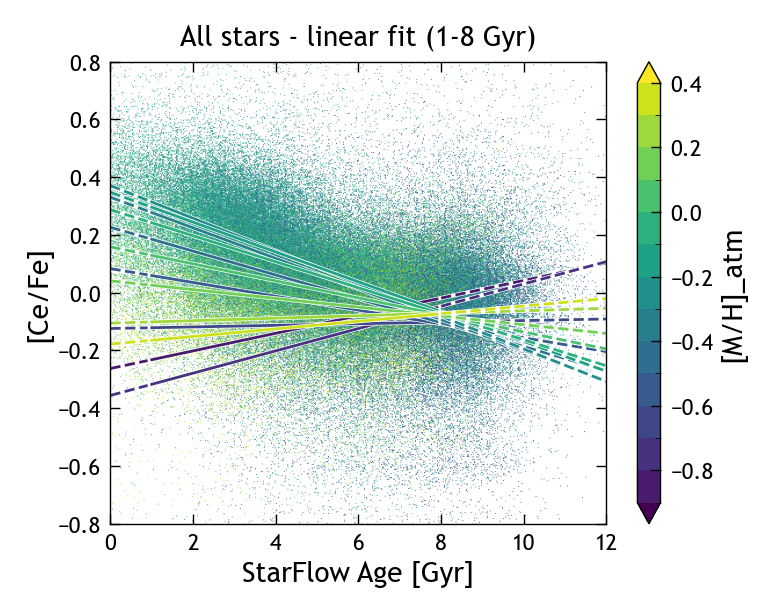

In [29]:
fig, ax = plt.subplots(figsize=(4, 3))

met_col = 'm_h_atm' # column with metallicity data
met_label = '[M/H]_atm'
met_bins = np.arange(-0.9, 0.5, 0.1)
age_arr = np.arange(0, 12.1, 0.1)
age_fit_range = (1, 8) # range for linear fits

cmap = plt.get_cmap('viridis')
norm = BoundaryNorm(met_bins, cmap.N, extend='both')

pc = ax.scatter(
    mwm_rgb['age'], mwm_rgb['ce_fe'], c=mwm_rgb[met_col], 
    cmap=cmap, norm=norm,
    s=0.5, marker='.', rasterized=True, edgecolor='none'
)
cbar = fig.colorbar(pc, ax=ax, label=met_label)

# Bin by metallicity and fit linear trend to <8 Gyr old stars
fits = []
for i in range(len(met_bins)-1):
    met_lim = met_bins[i:i+2]
    subset = mwm_rgb[
        (mwm_rgb[met_col] >= met_lim[0]) & 
        (mwm_rgb[met_col] < met_lim[1]) &
        (mwm_rgb['age'] >= age_fit_range[0]) &
        (mwm_rgb['age'] < age_fit_range[1])
    ]
    regress = stats.linregress(subset['age'], subset['ce_fe'])
    fits.append(regress)
    print(regress.rvalue)
    # Plot linear regression
    yfit = age_arr * regress.slope + regress.intercept
    ax.plot(age_arr, yfit, linestyle='-', linewidth=1.5, color='w')
    ax.plot(
        age_arr[age_arr < age_fit_range[0]], yfit[age_arr < age_fit_range[0]], 
        linestyle='--', linewidth=1, color=cmap(norm(met_lim[0]))
    )
    ax.plot(
        age_arr[(age_fit_range[0] <= age_arr) & (age_arr < age_fit_range[1])], 
        yfit[(age_fit_range[0] <= age_arr) & (age_arr < age_fit_range[1])], 
        linestyle='-', linewidth=1, color=cmap(norm(met_lim[0]))
    )
    ax.plot( # extends beyond fit region
        age_arr[age_arr >= age_fit_range[1]], yfit[age_arr >= age_fit_range[1]], 
        linestyle='--', linewidth=1, color=cmap(norm(met_lim[0]))
    )

ax.set_xlim((0, 12))
ax.set_ylim((-0.8, 0.8))
ax.set_xlabel('StarFlow Age [Gyr]')
ax.set_ylabel('[Ce/Fe]')
ax.set_title('All stars - linear fit (%s-%s Gyr)' % age_fit_range)

plt.show()

0.04853372056361507
0.11798452808292083
-0.10682484682096248
-0.3335644457420077
-0.4164027447820514
-0.4924958884157963
-0.5470131581919807
-0.5380228175509105
-0.5180993245956212
-0.39850662884412585
-0.2882935332915321
-0.06408413424292479
0.08146943881330161


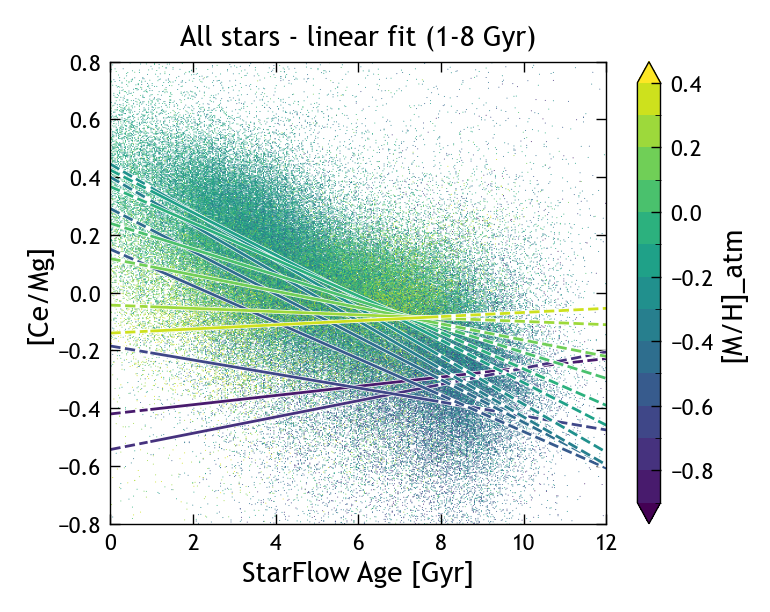

In [30]:
fig, ax = plt.subplots(figsize=(4, 3))

met_col = 'm_h_atm' # column with metallicity data
met_label = '[M/H]_atm'
met_bins = np.arange(-0.9, 0.5, 0.1)
age_arr = np.arange(0, 12.1, 0.1)
age_fit_range = (1, 8) # range for linear fits

cmap = plt.get_cmap('viridis')
norm = BoundaryNorm(met_bins, cmap.N, extend='both')

pc = ax.scatter(
    mwm_rgb['age'], mwm_rgb['ce_mg'], c=mwm_rgb[met_col], 
    cmap=cmap, norm=norm,
    s=0.5, marker='.', rasterized=True, edgecolor='none'
)
cbar = fig.colorbar(pc, ax=ax, label=met_label)

# Bin by metallicity and fit linear trend to <8 Gyr old stars
fits = []
for i in range(len(met_bins)-1):
    met_lim = met_bins[i:i+2]
    subset = mwm_rgb[
        (mwm_rgb[met_col] >= met_lim[0]) & 
        (mwm_rgb[met_col] < met_lim[1]) &
        (mwm_rgb['age'] >= age_fit_range[0]) &
        (mwm_rgb['age'] < age_fit_range[1])
    ]
    regress = stats.linregress(subset['age'], subset['ce_mg'])
    fits.append(regress)
    print(regress.rvalue)
    # Plot linear regression
    yfit = age_arr * regress.slope + regress.intercept
    ax.plot(age_arr, yfit, linestyle='-', linewidth=1.5, color='w')
    ax.plot(
        age_arr[age_arr < age_fit_range[0]], yfit[age_arr < age_fit_range[0]], 
        linestyle='--', linewidth=1, color=cmap(norm(met_lim[0]))
    )
    ax.plot(
        age_arr[(age_fit_range[0] <= age_arr) & (age_arr < age_fit_range[1])], 
        yfit[(age_fit_range[0] <= age_arr) & (age_arr < age_fit_range[1])], 
        linestyle='-', linewidth=1, color=cmap(norm(met_lim[0]))
    )
    ax.plot( # extends beyond fit region
        age_arr[age_arr >= age_fit_range[1]], yfit[age_arr >= age_fit_range[1]], 
        linestyle='--', linewidth=1, color=cmap(norm(met_lim[0]))
    )

ax.set_xlim((0, 12))
ax.set_ylim((-0.8, 0.8))
ax.set_xlabel('StarFlow Age [Gyr]')
ax.set_ylabel('[Ce/Mg]')
ax.set_title('All stars - linear fit (%s-%s Gyr)' % age_fit_range)

plt.show()

In [31]:
def quadratic(x, a0, a1, a2):
    return a0 + a1 * x + a2 * x ** 2

def cubic(x, a0, a1, a2, a3):
    return a0 + a1 * x + a2 * x ** 2 + a3 * x ** 3

def quartic(x, a0, a1, a2, a3, a4):
    return a0 + a1 * x + a2 * x ** 2 + a3 * x ** 3 + a4 * x ** 4

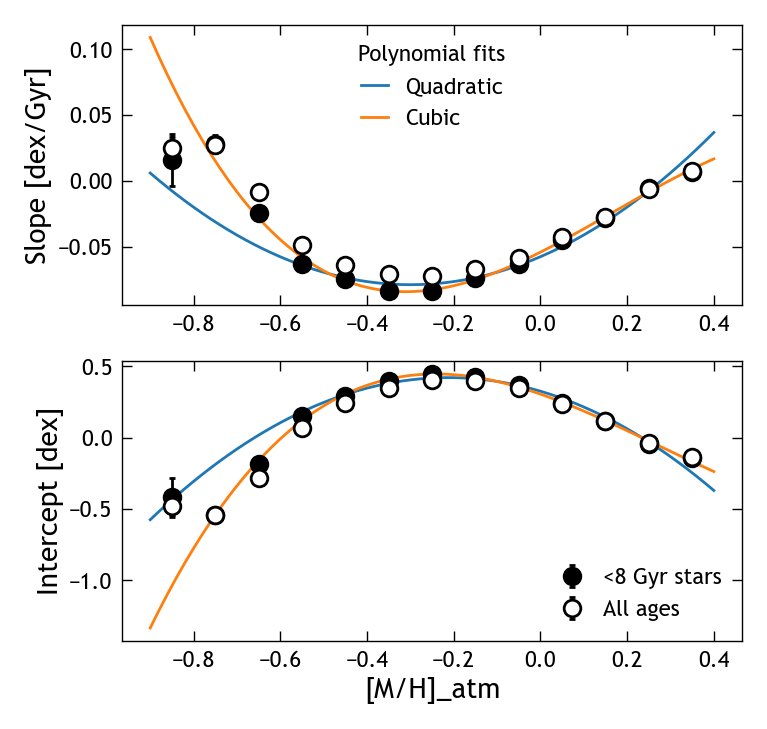

In [32]:
fig, axs = plt.subplots(2, figsize=(4, 4))

mgh_centers = get_bin_centers(met_bins)
colors = [cmap(norm(m)) for m in mgh_centers]
mgh_arr = np.arange(-0.9, 0.41, 0.01)

# Slopes fit to <8 Gyr stars
slopes = [f.slope for f in fits]
slope_errs = [f.stderr for f in fits]
axs[0].errorbar(mgh_centers, slopes, yerr=slope_errs, marker='o', c='k', linestyle='none')
axs[0].set_ylabel('Slope [dex/Gyr]')

popt, pcov = curve_fit(quadratic, mgh_centers, slopes, sigma=slope_errs)
axs[0].plot(mgh_arr, quadratic(mgh_arr, *popt), label='Quadratic')
popt, pcov = curve_fit(cubic, mgh_centers, slopes, sigma=slope_errs)
axs[0].plot(mgh_arr, cubic(mgh_arr, *popt), label='Cubic')
# popt, pcov = curve_fit(quartic, mgh_centers, slopes, sigma=slope_errs)
# axs[0].plot(mgh_arr, quartic(mgh_arr, *popt), label='Quartic')
axs[0].legend(title='Polynomial fits')

# Slopes fit to all ages
slopes = [f.slope for f in fits_all]
slope_errs = [f.stderr for f in fits_all]
axs[0].errorbar(mgh_centers, slopes, yerr=slope_errs, marker='o', c='k', linestyle='none', markerfacecolor='w')

intercepts = [f.intercept for f in fits]
intercept_errs = [f.intercept_stderr for f in fits]
axs[1].errorbar(mgh_centers, intercepts, yerr=intercept_errs, marker='o', c='k', linestyle='none', label='<8 Gyr stars')
axs[1].set_ylabel('Intercept [dex]')
axs[1].set_xlabel(met_label)

popt, pcov = curve_fit(quadratic, mgh_centers, intercepts, sigma=intercept_errs)
axs[1].plot(mgh_arr, quadratic(mgh_arr, *popt))
popt, pcov = curve_fit(cubic, mgh_centers, intercepts, sigma=intercept_errs)
axs[1].plot(mgh_arr, cubic(mgh_arr, *popt))
# popt, pcov = curve_fit(quartic, mgh_centers, intercepts, sigma=intercept_errs)
# axs[1].plot(mgh_arr, quartic(mgh_arr, *popt))

# Intercepts fit to all ages
intercepts = [f.intercept for f in fits_all]
intercept_errs = [f.intercept_stderr for f in fits_all]
axs[1].errorbar(mgh_centers, intercepts, yerr=intercept_errs, marker='o', c='k', linestyle='none', markerfacecolor='w', label='All ages')
axs[1].legend()

plt.show()

## Compare to s-process yields

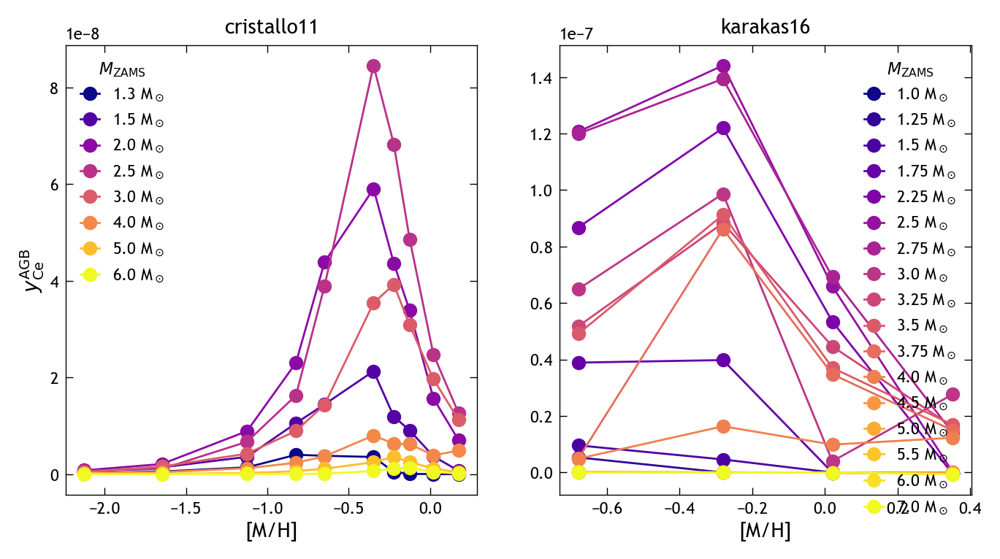

In [33]:
import vice

solar_z = sum([vice.solar_z[el] for el in vice.solar_z.keys() if el != 'he'])

fig, axs = plt.subplots(1, 2, figsize=(8, 4))

for j, study in enumerate(['cristallo11', 'karakas16']):
    grid, masses, metallicities = vice.yields.agb.grid('ce', study=study)
    cmap = plt.get_cmap('plasma')
    colors = cmap(np.linspace(0, 1, len(masses)))
    for i, m in enumerate(masses):
        yields = [grid[i][_] for _ in range(len(grid[0]))]
        mh = np.log10(np.array(metallicities) / solar_z)
        axs[j].plot(mh, yields, c=colors[i], marker='o', label=r'%s M$_\odot$' % m)
    axs[j].legend(title=r'$M_{\rm ZAMS}$')
    axs[j].set_title(study)
axs[0].set_xlabel('[M/H]')
axs[1].set_xlabel('[M/H]')
axs[0].set_ylabel(r'$y^{\rm AGB}_{\rm Ce}$')
plt.show()

### Metallicity bins across the galaxy

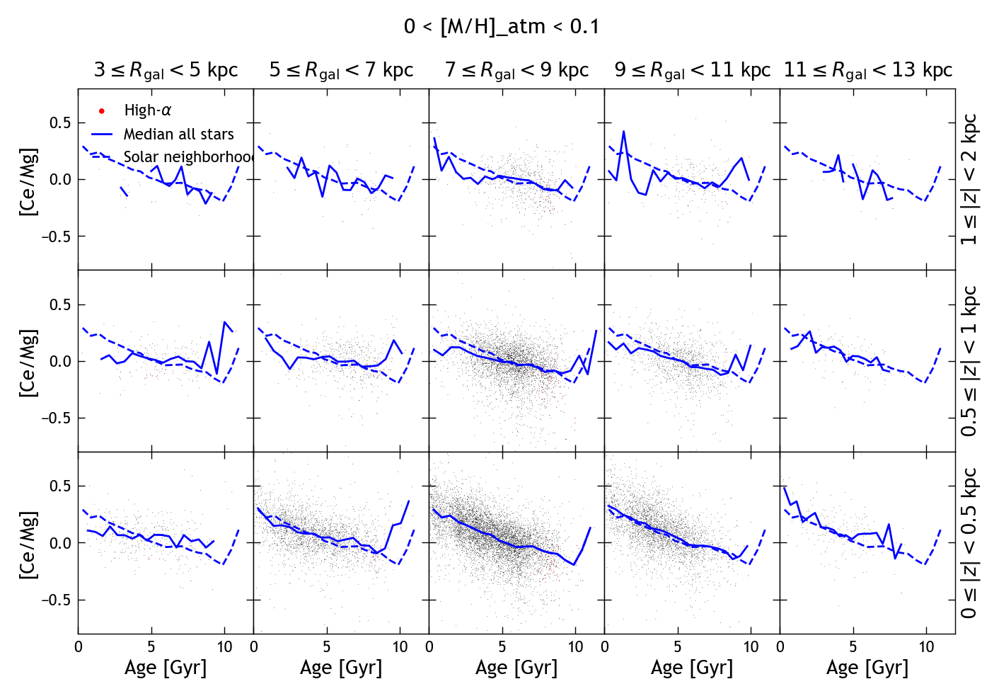

In [34]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02
met_lim = (0, 0.1)

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

local_subset = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 0.5) &
    (mwm_rgb['m_h_atm'] >= met_lim[0]) &
    (mwm_rgb['m_h_atm'] < met_lim[1])
]

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1]) &
            (mwm_rgb['m_h_atm'] >= met_lim[0]) &
            (mwm_rgb['m_h_atm'] < met_lim[1])
        ]
        ax.scatter(subset['age'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        ax.scatter(high_alpha['age'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)
        # Plot median trends
        ax.plot(*binned_medians(subset, 'ce_mg', 'age', 20), 'b-',
                label=r'Median all stars')
        # Local medians for comparison
        ax.plot(*binned_medians(local_subset, 'ce_mg', 'age', 20), 'b--',
                label='Solar neighborhood')

# Format axes
axs[0,0].set_xlim((0, 12))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('Age [Gyr]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)
fig.suptitle('%s < [M/H]_atm < %s' % met_lim)

plt.show()

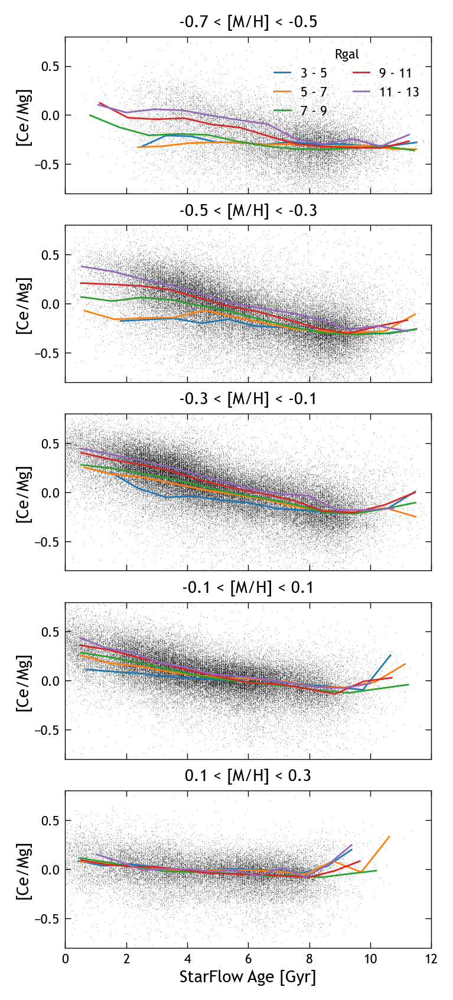

In [35]:
galr_bins = np.arange(3, 15, 2)
met_bins = np.arange(-0.7, 0.5, 0.2)
absz_lim = (0, 0.5)
met_col = 'm_h_atm'
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none', c='k')

fig, axs = plt.subplots(len(met_bins)-1, sharex=True, sharey=True, figsize=(4, 10))

for i in range(len(met_bins)-1):
    met_lim = met_bins[i:i+2]
    axs[i].set_title('%.01f < [M/H] < %.01f' % tuple(met_lim))
    met_subset = mwm_rgb[
        (mwm_rgb[met_col] >= met_lim[0]) & 
        (mwm_rgb[met_col] < met_lim[1])
    ]
    axs[i].scatter(met_subset['age'], met_subset['ce_mg'], **kwargs)
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        galr_subset = met_subset[
            (met_subset['gal_r'] >= galr_lim[0]) &
            (met_subset['gal_r'] < galr_lim[1]) &
            (met_subset['age'] < 12)
        ]
        axs[i].plot(
            *binned_medians(galr_subset, 'ce_mg', 'age', 12), 
            label='%s - %s' % galr_lim
        )

axs[0].set_xlim((0, 12))
axs[0].set_ylim((-0.8, 0.8))
axs[0].legend(title='Rgal', ncol=2, loc='upper right')
axs[-1].set_xlabel('StarFlow Age [Gyr]')
for ax in axs:
    ax.set_ylabel('[Ce/Mg]')
plt.show()